In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/TFRecords/Valid/Pizza_2219.tfrecord
/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/TFRecords/Valid/Taquito_3275.tfrecord
/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/TFRecords/Valid/Burger_423.tfrecord
/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/TFRecords/Valid/Hot Dog_1867.tfrecord
/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/TFRecords/Valid/Pizza_2355.tfrecord
/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/TFRecords/Valid/Hot Dog_1995.tfrecord
/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/TFRecords/Valid/Crispy Chicken_1046.tfrecord
/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/TFRecords/Valid/Crispy Chicken_832.tfrecord
/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/TFRecords/Vali

In [3]:
# Data Loading 
from keras.preprocessing.image import ImageDataGenerator

In [4]:
train_path = "/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/Train"
valid_path = "/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/Valid"
test_path = "/kaggle/input/fast-food-classification-dataset/Fast Food Classification V2/Test"

In [5]:
class_names = sorted(os.listdir(train_path))

In [6]:
class_names

['Baked Potato',
 'Burger',
 'Crispy Chicken',
 'Donut',
 'Fries',
 'Hot Dog',
 'Pizza',
 'Sandwich',
 'Taco',
 'Taquito']

In [7]:
import plotly.express as px
import matplotlib.pyplot as plt

In [8]:
class_dist = [len(os.listdir(train_path + "/" + name)) for name in class_names]

In [9]:
fig = plt.bar(class_names, class_dist, color=class_names)
fig.show()

In [10]:
class_dist2 = [len(os.listdir(valid_path + "/" + name)) for name in class_names]
fig = px.bar(x=class_names, y=class_dist2, color=class_names)
fig.show()

In [11]:
class_dist3 = [len(os.listdir(test_path + "/" + name)) for name in class_names]
fig = px.bar(x=class_names, y=class_dist3, color=class_names)
fig.show()

In [12]:
# İmage Data Generator

train_gen = ImageDataGenerator(rescale = 1/255, horizontal_flip = True, vertical_flip = False, rotation_range = 0)
valid_gen = ImageDataGenerator(rescale = 1/255)
test_gen = ImageDataGenerator(rescale = 1/255)

In [13]:
train_data = train_gen.flow_from_directory(train_path, target_size = (256,256), batch_size = 64, shuffle = True, class_mode = "binary")
valid_data = valid_gen.flow_from_directory(valid_path, target_size = (256,256), batch_size = 32, shuffle = True, class_mode = "binary")
test_data = test_gen.flow_from_directory(test_path, target_size = (256,256), batch_size = 32, shuffle = True, class_mode = "binary")

Found 15000 images belonging to 10 classes.
Found 3500 images belonging to 10 classes.
Found 1500 images belonging to 10 classes.


In [14]:
import tensorflow as tf
from IPython.display import clear_output as cls

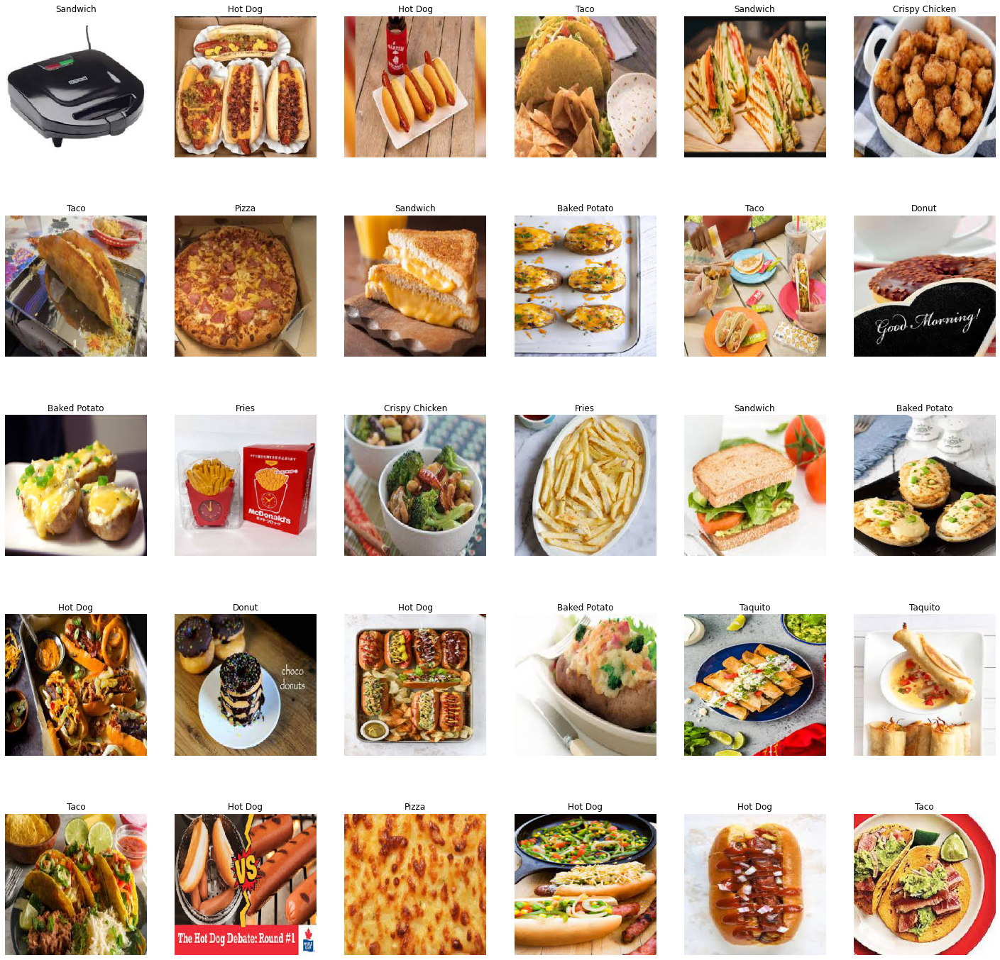

In [15]:
def show_images(data, class_names, model=None, GRID=[5,6], SIZE=(25,25)):
    n_rows, n_cols = GRID
    n_images = n_cols * n_rows
    plt.figure(figsize=SIZE)
    
    i = 1
    for images, labels in iter(data):
        id = np.random.randint(len(images))
        image, label = tf.expand_dims(images[id], axis=0), class_names[int(labels[id])]
        
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image[0])
        
        if model is not None:
            prediction = model.predict(image)[0]
            score = np.round(max(prediction), 2)
            pred = class_names[np.argmax(prediction)]
            title = f"True : {label}\nPred : {pred}"
        else:
            title = label
        
        plt.title(title)
        plt.axis('off')
        cls()
        
        i+=1
        if i>n_images:
            break
            

show_images(data=train_data, class_names=class_names)

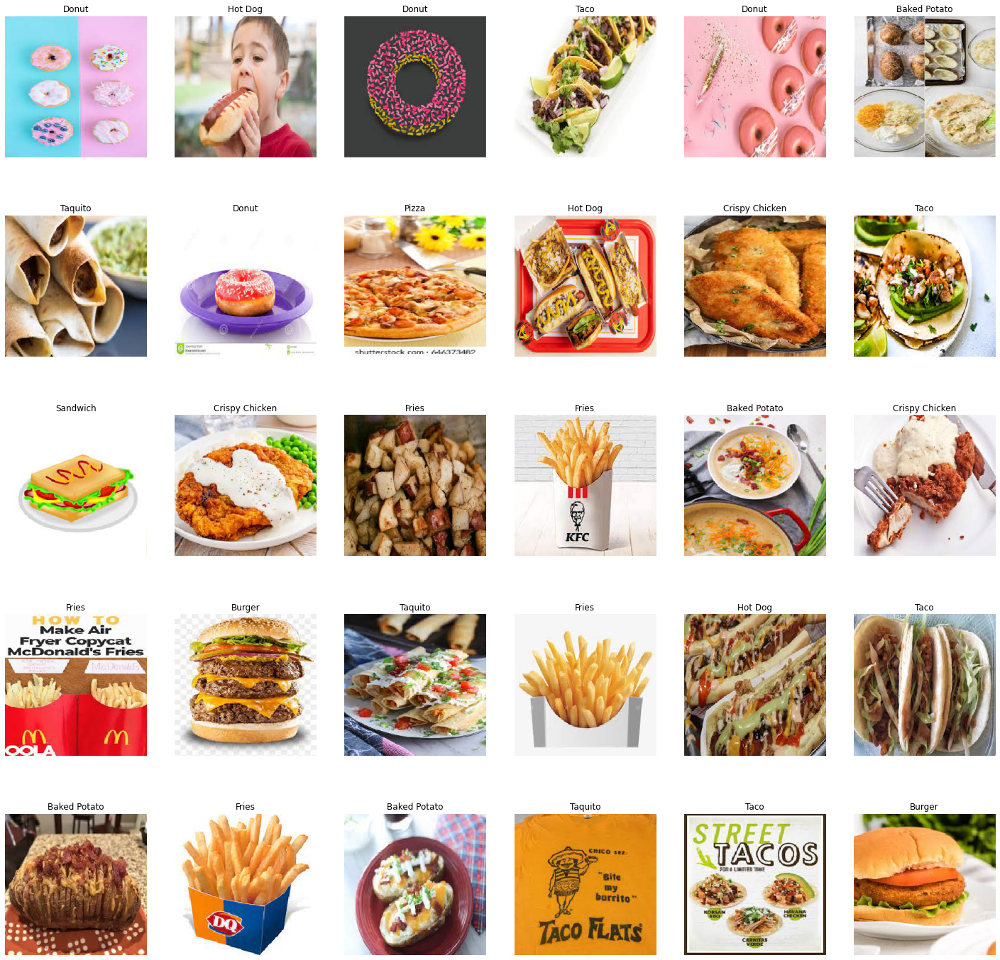

In [16]:
show_images(data=valid_data, class_names=class_names)

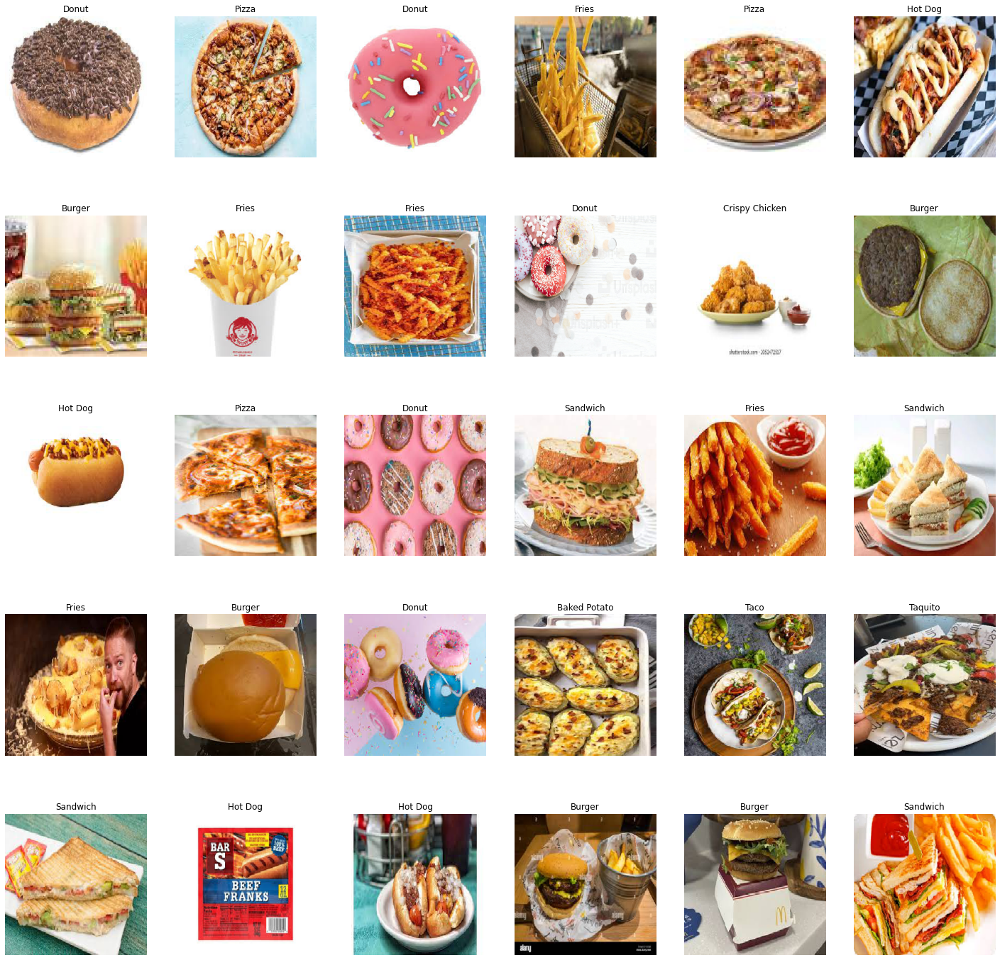

In [17]:
show_images(data=test_data, class_names=class_names)

### BİT M MODEL 

In [18]:
from tensorflow_hub import KerasLayer
from keras.layers import Dense, InputLayer, Dropout
from keras.models import Sequential

In [19]:
url = "https://tfhub.dev/google/bit/m-r50x1/1"
bit = KerasLayer(url)

In [22]:
model = Sequential([
    InputLayer(input_shape=(256, 256, 3)),
    bit,
    Dropout(0.2),
    Dense(64, activation='softmax', kernel_initializer='zeros')])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 2048)              23500352  
_________________________________________________________________
dropout_2 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 64)                131136    
Total params: 23,631,488
Trainable params: 131,136
Non-trainable params: 23,500,352
_________________________________________________________________


In [23]:
model.compile(loss='sparse_categorical_crossentropy',optimizer="adam", metrics=['accuracy'])

In [30]:
class EarlyStopping(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    '''
    Stops training when 95% accuracy is reached
    '''
    # Get the current accuracy and check if it is above 95%
    if(logs.get('accuracy') > 0.95):

      # Stop training if condition is met
      print("\nThreshold reached. Stopping training...")
      self.model.stop_training = True

# Let's instantiate our ES class
early_stopping = EarlyStopping()

In [31]:
history = model.fit(train_data, validation_data=valid_data, steps_per_epoch= len(train_data), validation_steps = len(valid_data), verbose = "auto",epochs=10,callbacks=[early_stopping])

Epoch 1/10
235/235 [==============================] - 159s 676ms/step - loss: 0.2238 - accuracy: 0.9393 - val_loss: 0.6199 - val_accuracy: 0.8929
Epoch 2/10
235/235 [==============================] - 157s 669ms/step - loss: 0.2203 - accuracy: 0.9389 - val_loss: 0.6875 - val_accuracy: 0.8854
Epoch 3/10
235/235 [==============================] - 158s 673ms/step - loss: 0.2302 - accuracy: 0.9369 - val_loss: 0.6708 - val_accuracy: 0.8869
Epoch 4/10
235/235 [==============================] - 158s 672ms/step - loss: 0.2312 - accuracy: 0.9381 - val_loss: 0.6438 - val_accuracy: 0.8886
Epoch 5/10
235/235 [==============================] - 159s 674ms/step - loss: 0.2227 - accuracy: 0.9419 - val_loss: 0.7157 - val_accuracy: 0.8803
Epoch 6/10
235/235 [==============================] - 158s 672ms/step - loss: 0.2315 - accuracy: 0.9367 - val_loss: 0.7050 - val_accuracy: 0.8863
Epoch 7/10
235/235 [==============================] - 158s 672ms/step - loss: 0.2153 - accuracy: 0.9427 - val_loss: 0.7782 -

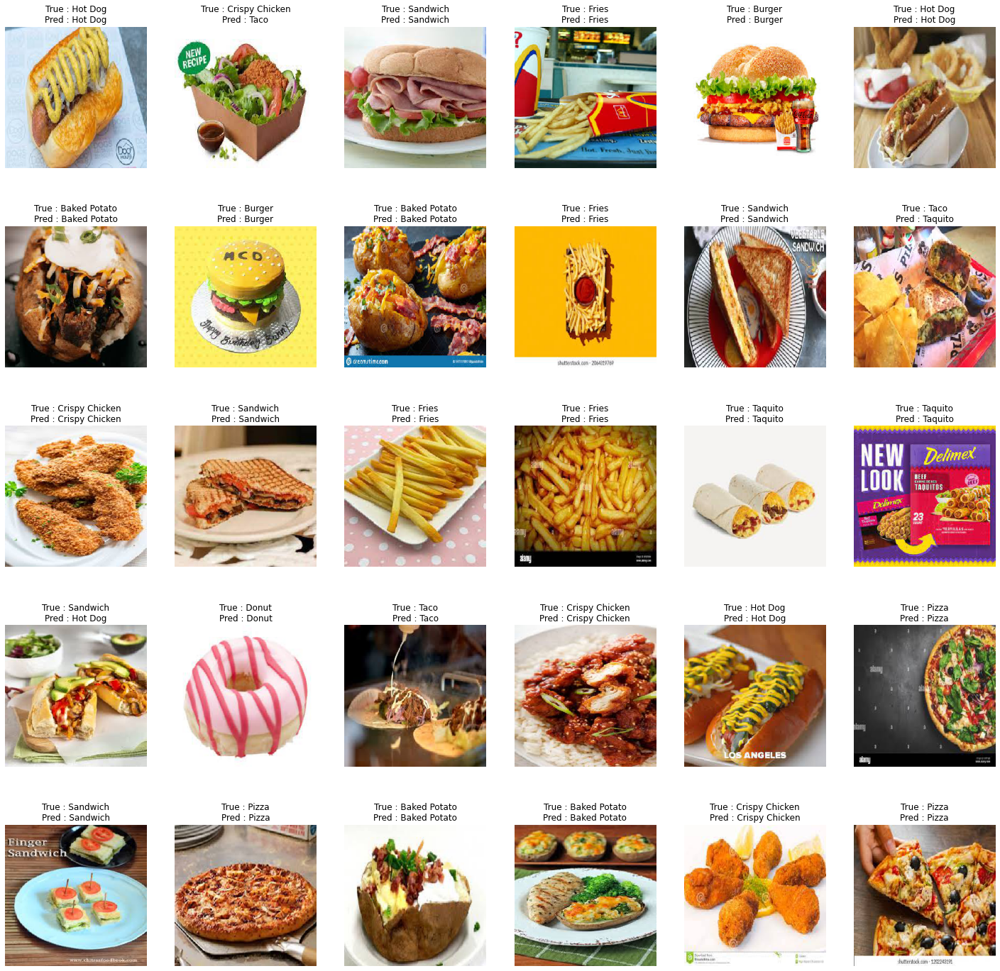

In [32]:
show_images(data=valid_data, class_names=class_names, model=model)